# **ARIMA-GARCH model for long-term forecasting**

### Importing libraries

In [147]:
# Importing Libraries
import numpy as np
import pandas as pd
import pandas_datareader as pdr
from  datetime import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go

import statsmodels.api as sms
from scipy.stats import norm
from statsmodels.tsa.stattools import adfuller
from statsmodels.stats.diagnostic import het_arch
from scipy.stats import shapiro

from statsmodels.tsa.arima.model import ARIMA
from arch import arch_model
from arch.univariate import ARCH, GARCH
from arch.univariate import Normal

from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf

#Ignore warnings
import warnings
warnings.filterwarnings("ignore")

### Defining the used functions

In [148]:
def stationarity_test(data, reg_param): # Testing for Stationarity
    adf_result = adfuller(data, regression=reg_param, autolag = "AIC")
    print('The p-value  for the stationarity test is : {}'.format(round(adf_result[1], 2)))

In [149]:
def residual_serial_corr_test(data):
    x = sm.stats.acorr_ljungbox(data, lags=[5], return_df=True).iloc[0, 1]
    print('The pvalue of the serial correlation test  in the residuals is : {}'.format(round(x, 2)))

In [150]:
def residual_normality_test(data):
    x, p = shapiro(data)
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,5))
    sm.graphics.qqplot(data, dist=norm, line='45', fit=True, ax=ax1)
    sns.distplot(data, ax=ax2)
    plt.show()
    print('The pvalue of the normality test in the residuals is : {}'.format(round(p, 2)))

In [151]:
def arima_tuning(data, reg_parm, trend, max_p, max_q): # Finding the best ARIMA parameters
    adf_result = adfuller(data, regression=reg_parm, autolag = "AIC")
    if (adf_result[1] <= 0.05):
        d = 0
    else:
        diff = data.diff(periods=1).dropna()
        adf_result = adfuller(diff, regression=reg_parm, autolag = "AIC")
        if (adf_result[1] <= 0.05):
            d = 1
        else:
            diff = diff.diff(periods=1).dropna()
            adf_result = adfuller(diff, regression=reg_parm, autolag = "AIC")
            if (round(adf_result[1], 4) <= 0.05):
                d = 2
    AIC = {}
    for p in range(max_p):
        for q in range(max_q):
            model = ARIMA(data, trend=trend, order=(p,d,q)).fit()
            n=0
            for i in model.pvalues:
                if (i <= 0.05):
                    n = n + 1
            if trend == 'n':
                if( n == p+q + 1):
                    AIC[(p,d,q)] = model.aic
            if trend == 't':
                if( n == p+q + 2):
                    AIC[(p,d,q)] = model.aic
    for order, aic in AIC.items():
        if aic == min(AIC.values()):
            p,d,q = order
    return p,d,q

In [152]:
def garch_tuning(data, max_p, max_q):# Finding the best GARCH parameters
    AIC = {}
    for p in range(1, max_p):
        for q in range(max_q):
            model = arch_model(data, mean='AR', p=p, q=q).fit(disp="off", show_warning=False)
            n=0
            for i in model.pvalues:
                if (i <= 0.05):
                    n = n +1
            if( n == p+q + 2):
                AIC[(p,q)] = model.aic
    for order, aic in AIC.items():
        if aic == min(AIC.values()):
            p,q = order
    return p,q

In [153]:
def ARCH_test(data, p, q): # Testing for AutoRegressive Conditional Heteroskedasticity
    from statsmodels.stats.diagnostic import het_arch
    test  = het_arch(data, ddof=p+q)
    if (test[-1] <= 0.05):
        x = True
    else:
        x = False
    return x

## Get sample data

In [159]:
data = pdr.get_data_yahoo('^GSPC', dt(1971, 1, 1), dt(2020, 1, 1)).iloc[:, -1]
df = data.copy()

In [160]:
df

Date
1971-01-04      91.150002
1971-01-05      91.800003
1971-01-06      92.349998
1971-01-07      92.379997
1971-01-08      92.190002
                 ...     
2019-12-24    3223.379883
2019-12-26    3239.909912
2019-12-27    3240.020020
2019-12-30    3221.290039
2019-12-31    3230.780029
Name: Adj Close, Length: 12359, dtype: float64

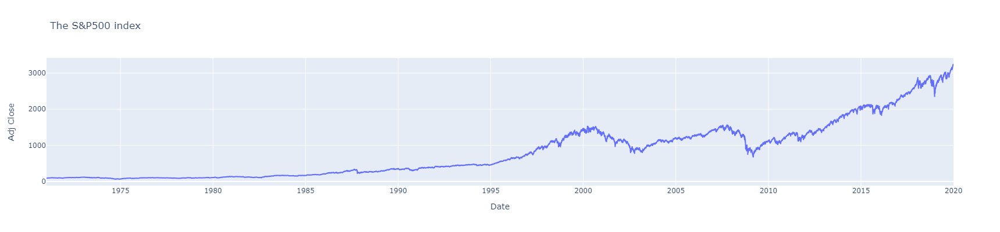

In [161]:
fig = px.line(df, y="Adj Close", title = 'The S&P500 index', width=1400, height=400)
fig.show()

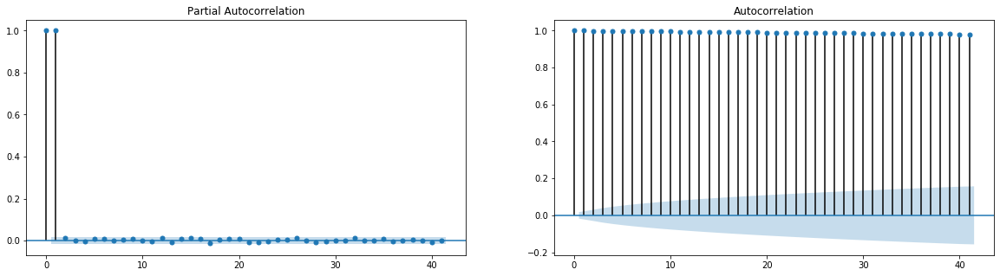

In [162]:
# PACF and ACF --> Checking for Stationarity and Weak-dependence conditions
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,5))
pacf_plot = plot_pacf(df, ax=ax1)
acf_plot = plot_acf(df, ax=ax2)

In [163]:
stationarity_test(df, reg_param='ct')

The p-value  for the stationarity test is : 1.0


## Splitting the Data in Training and Testing Sets

In [164]:
# print(df.shape) --> (12359, 1)
df_test = df.iloc[int(len(df)*(1 - 0.10)):].copy()
df_train = df.iloc[:int(len(df)*(1 - 0.10))].copy()
# print(df_train.shape,df_test.shape) --> (11123, 1) (1236, 1)

## Selecting the best ARIMA model

In [166]:
# Defining the best ARIMA model using the arima_tuning function
print('The Best Arima Model for our df_train data is : ARIMA({})'.format(arima_tuning(df_train, reg_parm='ct', trend='t', max_p=5, max_q=5)))

The Best Arima Model for our df_train data is : ARIMA((3, 1, 4))


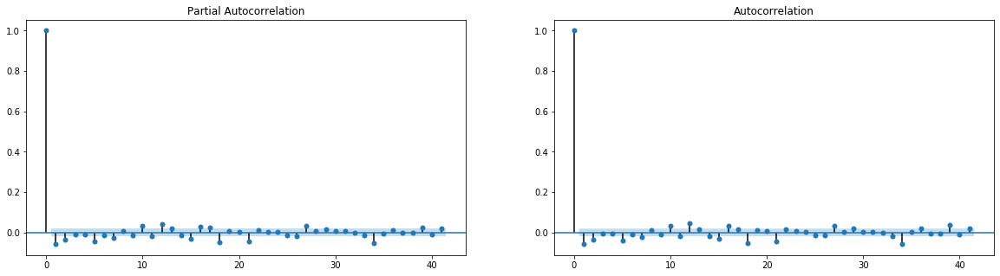

In [62]:
# PACF and ACF --> Checking for Stationarity and Weak-dependence conditions after first differencing
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,5))
pacf_plot = plot_pacf(df_train.diff(periods=1).dropna(), ax=ax1)
acf_plot = plot_acf(df_train.diff(periods=1).dropna(), ax=ax2)

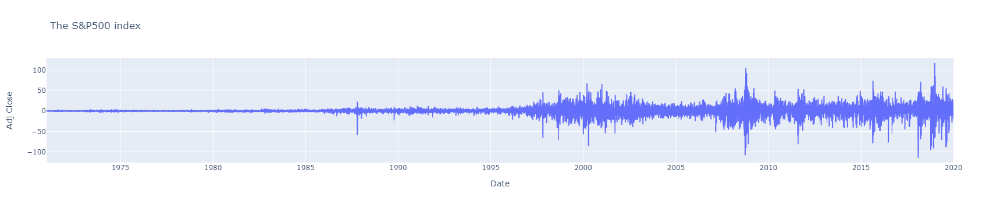

In [64]:
# Plotting the differenced data
fig = px.line(df.diff(periods=1).dropna(), y="Adj Close", title = 'The S&P500 index')
fig.show()

## Fitting the best ARIMA model and checking the residuals

In [65]:
arima_model = ARIMA(df_train, trend='t', order=(1,1,1)).fit()
print(arima_model.summary())

                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                11123
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -40708.199
Date:                Mon, 29 Nov 2021   AIC                          81424.399
Time:                        13:55:07   BIC                          81453.666
Sample:                             0   HQIC                         81434.253
                              - 11123                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.1756      0.081      2.163      0.031       0.016       0.335
ar.L1          0.6510      0.031     20.964      0.000       0.590       0.712
ma.L1         -0.7098      0.028    -25.028      0.0

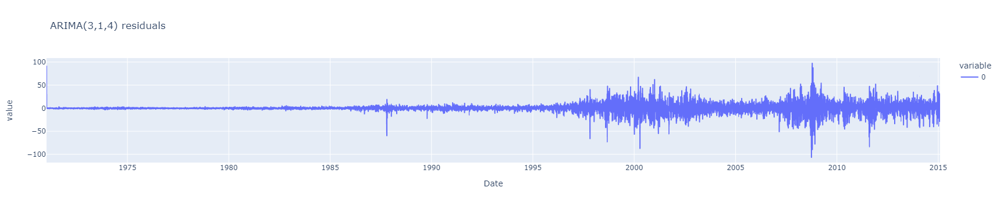

In [66]:
fig = px.line(arima_model.resid, title = 'ARIMA(3,1,4) residuals')
fig.show()

In [111]:
#Testing for serial correlation in the residuals
residual_serial_corr_test(arima_model.resid)

The pvalue of the serial correlation test  in the residuals is : 0.01


In [112]:
# Stationarity test on the ARIMA residuals
stationarity_test(arima_model.resid, reg_param='ct')

The p-value  for the stationarity test is : 0.0


In [67]:
# Autoregression conditional Heteroskedasity (ARCH) test
x = ARCH_test(arima_model.resid, p=1, q=1)
print('Presence of ARCH effect is : {}'.format(x))

Presence of ARCH effect is : True


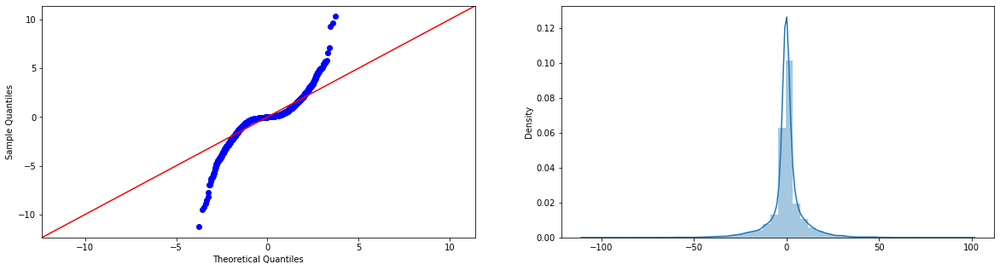

The pvalue of the normality test in the residuals is : 0.0


In [132]:
# Testing for the Normality of the ARIMA residuals
residual_normality_test(arima_model.resid)

The residuals are not White Noise because the residuals variance is heteroskedastic

## Selecting the best GARCH model

In [85]:
# Defining the best GARCH model using the arima_tuning function
print('The Best GARCH Model for our df_train data is : GARCH({})'.format(garch_tuning(arima_model.resid, max_p=5, max_q=5)))

The Best GARCH Model for our df_train data is : GARCH((1, 1))


## Fitting the best GARCH model and checking the residuals

In [86]:
gam = arch_model(arima_model.resid, mean='Zero', p=1, q=1)
garch_model = gam.fit(disp="off")
garch_model

                       Zero Mean - GARCH Model Results                        
Dep. Variable:                   None   R-squared:                       0.000
Mean Model:                 Zero Mean   Adj. R-squared:                  0.000
Vol Model:                      GARCH   Log-Likelihood:               -30524.2
Distribution:                  Normal   AIC:                           61054.4
Method:            Maximum Likelihood   BIC:                           61076.4
                                        No. Observations:                11123
Date:                Mon, Nov 29 2021   Df Residuals:                    11123
Time:                        14:17:28   Df Model:                            0
                              Volatility Model                              
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
omega      7.8639e-03  2.375e-03      3.311  9.285e-04 [3.

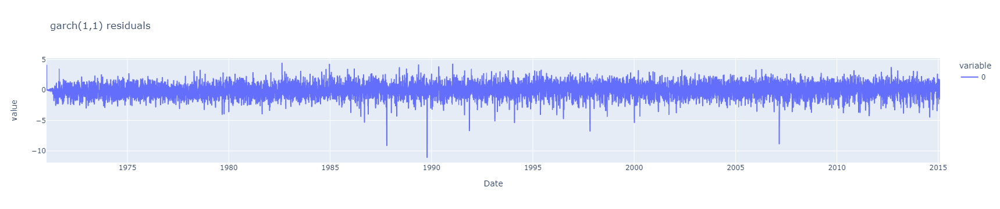

In [87]:
standarized_resid = garch_model.resid/garch_model.conditional_volatility
fig = px.line(standarized_resid, title = 'garch(1,1) residuals')
fig.show()

In [89]:
# Stationarity test on the GARCH residuals
stationarity_test(standarized_resid, reg_param='ct')

The p-value  for the stationarity test is : 0.0


In [88]:
# Autoregression conditional Heteroskedasity (ARCH) test on the GARCH(1,1) standarized residuals
x = ARCH_test(standarized_resid, p=1, q=1)
print('Presence of ARCH effect in the GARCH(1,1) residuals is : {}'.format(x))

Presence of ARCH effect in the GARCH(1,1) residuals is : False


In [110]:
# testing for serial correlation in the residuals
residual_serial_corr_test(standarized_resid)

The pvalue of the serial correlation test  in the residuals is : 0.0


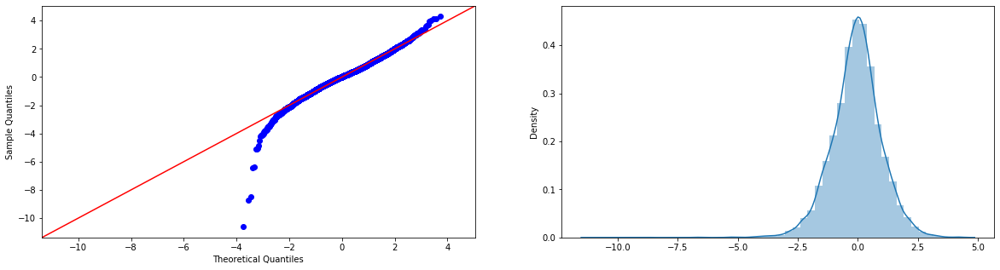

The pvalue of the normality test in the residuals is : 0.0


In [133]:
# Testing for the Normality of the GARCH residuals
residual_normality_test(standarized_resid)

We can say that the GARCH(1,1) residual are white noise

## Plotting the ARIMA mean_forecast

In [138]:
# Forecasting using get_forecast to get the mean_forecasts and the confidence intervals
arima_forecast = arima_model.get_forecast(steps=len(df_test))

In [139]:
# getting the mean_forecast
mean_forecast = pd.DataFrame(arima_forecast.predicted_mean.values, index=df_test.index, columns=['mean_forecast'])
# Getting the 95% confidence interval
lower_bound = pd.DataFrame(arima_forecast.conf_int(alpha=0.05)['lower Adj Close'].values, index=df_test.index, columns=['lower_bound'])
upper_bound =pd.DataFrame(arima_forecast.conf_int(alpha=0.05)['upper Adj Close'].values, index=df_test.index, columns=['upper_bound'])

In [145]:
# Packing everything in one data_frame
Mean = pd.concat([df_train.rename(columns={'Adj Close' : 'train'}), mean_forecast, df_test.rename(columns={'Adj Close' : 'test'}), lower_bound, upper_bound], join='outer')[360*11:]

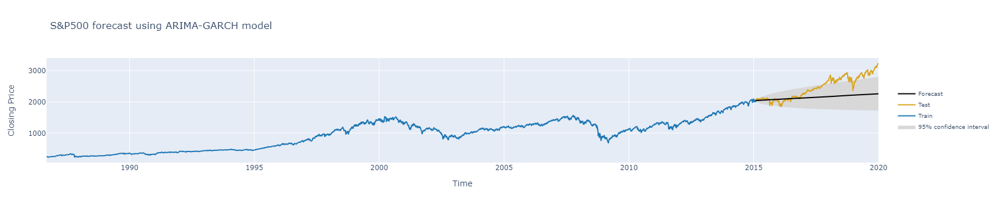

In [142]:
#Visualizing the Results
fig = go.Figure([
    go.Scatter(
        name='95% confidence interval',
        x=Mean.index,
        y=Mean['lower_bound'],
        mode='lines',
        line=dict(width=0),
        showlegend=False
    ),
    go.Scatter(
        name='95% confidence interval',
        x=Mean.index,
        y=Mean['upper_bound'],
        marker=dict(color="#444"),
        line=dict(width=0),
        mode='lines',
        fillcolor='rgb(216, 216, 216)',
        fill='tonexty',
        showlegend=True
    ),
    go.Scatter(
        name='Train',
        x=Mean.index,
        y=Mean['train'],
        mode='lines',
        line=dict(color='rgb(31, 119, 180)'),
    ),
    go.Scatter(
        name='Test',
        x=Mean.index,
        y=Mean['test'],
        mode='lines',
        line=dict(color='goldenrod'),
    ),
    go.Scatter(
        name='Forecast',
        x=Mean.index,
        y=Mean['mean_forecast'],
        line=dict(color='black'),
        mode='lines'
    )
])
fig.update_layout(legend=dict(y=0.5, font_size=10), title = 'S&P500 forecast using ARIMA-GARCH model')
fig.update_xaxes(title_text='Time')
fig.update_yaxes(title_text='Closing Price')
fig.write_html("E:/Directory/Neoma Courses/Data viz Directory/pp.html")
fig.show()